In [1]:
#!pip install -Uqq pytorch-lightning==1.0.0 omegaconf
#!pip install -Uqq git+https://github.com/albumentations-team/albumentations
#!pip uninstall -y torchtext
#!git clone https://github.com/sergio2pi/pytorch_retinanet.git
#!pip install Cython

#Update sys path to include the pytorch RetinaNet modules
import warnings
import os
import sys

warnings.filterwarnings('ignore')
sys.path.append("C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/pytorch_retinanet-master/")
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
#!pip install roboflow

#from roboflow import Roboflow
#rf = Roboflow(api_key="nu1vSNWbh9VrqdQDffr7")
#project = rf.workspace("mohamed-traore-2ekkp").project("forklift-dsitv")
#dataset = project.version(2).download("retinanet")

In [3]:
import pandas as pd
from PIL import Image
import cv2
import numpy as np

In [4]:
#Set up paths

#Path to where the Images are stored
TRAIN_IMAGE_PATH = "C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/train/"
VALID_IMAGE_PATH = "C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/valid/"
TEST_IMAGE_PATH  = "C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/test/"

#Path to where annotations are stored
TRAIN_CSV = "C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/train/_annotations.csv"
VALID_CSV = "C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/valid/_annotations.csv"
TEST_CSV  = "C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/test/_annotations.csv"



In [5]:
train_df = pd.read_csv(TRAIN_CSV)
valid_df = pd.read_csv(VALID_CSV)
test_df  = pd.read_csv(TEST_CSV)

train_df.columns = ['filename', 'xmin', 'ymin', 'xmax', 'ymax', 'labels', 'class']
valid_df.columns = ['filename', 'xmin', 'ymin', 'xmax', 'ymax', 'labels', 'class']
test_df.columns  = ['filename', 'xmin', 'ymin', 'xmax', 'ymax', 'labels', 'class']

if 'class' not in train_df.columns:
  class_ = [1 if label == 'forklift' else 2 for label in train_df.labels]
  train_df['class'] = class_

  class_ = [1 if label == 'forklift' else 2 for label in valid_df.labels]
  valid_df['class'] = class_

  class_ = [1 if label == 'forklift' else 2 for label in test_df.labels]
  test_df['class'] = class_

#Save the dataframes to memory
train_df.to_csv(TRAIN_CSV, index=False)
valid_df.to_csv(VALID_CSV, index=False)
test_df.to_csv(TEST_CSV, index=False)

In [6]:

train_df.head()

,filename,xmin,ymin,xmax,ymax,labels,class
0,JR43V3D9QMTL_jpg.rf.b3d0604b2bfde109bc55f29b6d...,32,17,378,404,forklift,1
1,GHRMLV7CGPRQ_jpg.rf.b4e1a83340bcdbee69877ce586...,218,144,297,201,person,2
2,GHRMLV7CGPRQ_jpg.rf.b4e1a83340bcdbee69877ce586...,39,178,93,235,person,2
3,GHRMLV7CGPRQ_jpg.rf.b4e1a83340bcdbee69877ce586...,156,112,365,375,forklift,1
4,ZBSHFC3OHSL5_jpg.rf.b4412395fd2fd450cf23b6ea32...,106,2,390,415,forklift,1


In [7]:
valid_df.head()

,filename,xmin,ymin,xmax,ymax,labels,class
0,KI0O8NRWVWKI_jpg.rf.19018309a85b0e8be403d900a4...,171,168,191,235,person,2
1,KI0O8NRWVWKI_jpg.rf.19018309a85b0e8be403d900a4...,186,106,352,333,forklift,1
2,KI0O8NRWVWKI_jpg.rf.19018309a85b0e8be403d900a4...,25,205,46,293,person,2
3,Z003TF03UTK1_jpg.rf.041d125a6d9a2ece471e4d769c...,29,31,291,350,forklift,1
4,Z003TF03UTK1_jpg.rf.041d125a6d9a2ece471e4d769c...,241,81,395,356,forklift,1


In [8]:
test_df.head()

,filename,xmin,ymin,xmax,ymax,labels,class
0,S92LNJ9OWXLU_jpg.rf.00d9622175cf34b4958e71595f...,83,147,114,208,person,2
1,S92LNJ9OWXLU_jpg.rf.00d9622175cf34b4958e71595f...,54,128,233,302,forklift,1
2,S92LNJ9OWXLU_jpg.rf.00d9622175cf34b4958e71595f...,219,165,283,309,person,2
3,HI8Z6B483YS1_jpg.rf.0640380879a7dce71a640c6c5f...,33,10,401,213,forklift,1
4,J3LLL37XGGDG_jpg.rf.2816c195efe92754c754e321a0...,158,167,176,215,person,2


In [9]:
from utils.pascal import generate_pascal_category_names

LABEL_MAP = generate_pascal_category_names(train_df)
LABEL_MAP

['__background__', 'forklift', 'person']

In [10]:
from utils import visualize_boxes_and_labels_on_image_array as viz_bbs
import matplotlib.pyplot as plt


def grab_bbs_(dataframe, index:int):
    """
    Takes in a Pandas DataFrame and a index number
    Returns filename of the image and all the bounding boxes and class_labels
    corresponding the image that is at the given index

    Params
    ------
        dataframe : a pandas dataframe object
        index (int) : a integer corresponding to a index in the pandas dataframe

    Returns
    -------
        fname (str) : path to the selected image.
        bbbs (list) : a list containing the bounding box annotations for the `fname`.
        cls (list) : a list containing the integer class labels for the box annotations.
    """
    assert index <= len(dataframe), f"Invalid index for dataframe with len: {len(dataframe)}"
    fname = dataframe.filename[index]
    locs  = dataframe.loc[dataframe.filename == fname]
    bbs   = locs[["xmin", "ymin", "xmax", "ymax"]].values
    cls   = locs["class"].values
    return fname, bbs, cls

def load_image_from_data(dataframe, index, path):
    """
    Loads in a image from the given dataframe at given index
    Returns a PIL image object contraining all the bounding boxes over
    the image
    """
    image, boxes, clas = grab_bbs_(dataframe, index)
    #load and normalize the image
    image = Image.open(f'{path}{image}')
    image = np.array(image) / 255.
    image = viz_bbs(image, boxes, scores=None, classes=clas, label_map=LABEL_MAP)
    return image

In [11]:
import PIL
print(PIL.__version__)

9.4.0


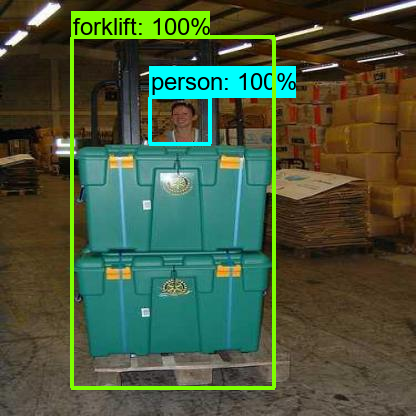

In [12]:
image = load_image_from_data(train_df, index=12, path=TRAIN_IMAGE_PATH)
image

## Configuracion PyTorch RetinaNet

Pretrained en False, no se utilizan pesos preentrenados para el entrenamiento.

In [21]:
NUM_TRAIN_EPOCHS = 500


from omegaconf import OmegaConf

#load in the hparams.ymal file using Omegaconf
hparams = OmegaConf.load("C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/pytorch_retinanet-master/hparams.yaml")

# ========================================================================= #
# MODIFICATION OF THE CONFIG FILE TO FIX PATHS AND DATSET-ARGUEMENTS :
# ========================================================================= #
hparams.dataset.kind        = "csv"
hparams.dataset.trn_paths   = TRAIN_CSV
hparams.dataset.valid_paths = VALID_CSV
hparams.dataset.test_paths  = TEST_CSV

hparams.dataloader.train_bs = 32
hparams.dataloader.valid_bs = 32
hparams.dataloader.test_bs  = 32

hparams.model.num_classes   = len(LABEL_MAP) - 1
hparams.model.backbone_kind = "resnet50"
hparams.model.min_size      = 416
hparams.model.max_size      = 416
hparams.model.pretrained    = False #Sin pesos preentrenados

size = 416  # Reemplaza con el tamaño deseado

#transforms for the train_dataset
hparams.transforms  =  [
    {"class_name": "albumentations.HorizontalFlip", "params": {"p": 0.5} },
    {"class_name": "albumentations.Rotate", "params": {'limit':(-20, 20), "p": 0.5} },
    {"class_name": "albumentations.RandomResizedCrop", "params": {'height':size, 'width':size, 'scale':(0.8, 1.0), 'ratio':(0.9, 1.11), 'p':0.5 } },
    {"class_name": "albumentations.Blur", "params": {'blur_limit':(2, 3), 'p':0.3} },
    {"class_name": "albumentations.MedianBlur", "params": {'blur_limit':(3, 5) , 'p':0.2} },
    {"class_name": "albumentations.CLAHE", "params": {'clip_limit':(1, 4.0), 'tile_grid_size':(8, 8), 'p':0.3} },
    {"class_name": "albumentations.RandomBrightnessContrast", "params": {'brightness_limit':0.2, 'contrast_limit':0.2, 'p':0.5} },
    {"class_name": "albumentations.ColorJitter", "params": {'brightness':0.2, 'contrast':0.2, 'saturation':0.2, 'hue':0.09, 'p':0.4} }
]

#optimizer
hparams.optimizer = {
    "class_name": "torch.optim.Adam",
    "params"    : {"lr": 0.001, "weight_decay": 0.0005},
    }

hparams.loss = {
    "class_name": "torch.nn.SmoothL1Loss",
    "params": {"beta": 0.1}
}

#scheduler

hparams.scheduler = {
    "class_name" : "torch.optim.lr_scheduler.CosineAnnealingLR",
    "params"     : {"T_max": NUM_TRAIN_EPOCHS},
    "monitor"    : None,
    "interval"   : "epoch",
    "frequency"  : 1
    }

# hparams.scheduler = {
#     "class_name": "torch.optim.lr_scheduler.StepLR",
#     "params": {"step_size": 30, "gamma": 0.1},
#     "monitor": None,
#     "interval": "epoch",
#     "frequency": 1
# }

#training
hparams.training = {
    "metric" : "map_50"
    }

print(OmegaConf.to_yaml(hparams))

model:
  backbone_kind: resnet50
  num_classes: 2
  freeze_bn: true
  min_size: 416
  max_size: 416
  pretrained: false
dataset:
  kind: csv
  root_dir: false
  trn_paths: C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/train/_annotations.csv
  valid_paths: C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/valid/_annotations.csv
  test_paths: C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/test/_annotations.csv
dataloader:
  train_bs: 32
  valid_bs: 32
  test_bs: 32
  args:
    num_workers: 0
    pin_memory: true
transforms:
- class_name: albumentations.HorizontalFlip
  params:
    p: 0.5
- class_name: albumentations.Rotate
  params:
    limit:
    - -20
    - 20
    p: 0.5
- class_name: albumentations.RandomResizedCrop
  params:
    height: 416
    width: 416
    scale:
    - 0.8
    - 1.0
    rati

## Instancia de Lightning-Module y Lightning-Trainer

In [14]:
import pytorch_lightning as pl
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import LearningRateMonitor, EarlyStopping

from model import RetinaNetModel

# seed so that results are reproducible
pl.seed_everything(123)

123

In [22]:
# ============================================================ #
# INSTANTIATE LIGHTNING-TRAINER with CALLBACKS :
# ============================================================ #
# NOTE:
# For a list of whole trainer specific arguments see :
# https://pytorch-lightning.readthedocs.io/en/latest/trainer.html

lr_logger  = LearningRateMonitor(logging_interval="step")

#instantiate LightningTrainer
trainer    = Trainer(precision=16, gpus=1, callbacks=[lr_logger], max_epochs=NUM_TRAIN_EPOCHS)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Using native 16bit precision.


## Load in the Lighning-Trainer :

In [23]:
# Instantiate lightning-module
litModel = RetinaNetModel(conf=hparams)

trainer.fit(litModel)

BACKBONE     : resnet50
INPUT_PARAMS : MAX_SIZE=416, MIN_SIZE=416
NUM_CLASSES  : 2

  | Name | Type      | Params
-----------------------------------
0 | net  | Retinanet | 36 M  


Epoch 499: 100%|██████████| 13/13 [00:06<00:00,  2.01it/s, loss=0.124, v_num=2, classification_loss=0.0571, regression_loss=0.0665, val_loss=0.928]


1

In [24]:
map = trainer.test(litModel)

creating index...
index created!
Testing: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.176
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.462
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.136
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.036
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.290
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.301
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.193
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.365
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.379
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

**Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.022**

## Export

In [25]:
import torch
PATH = f"C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/pytorch_retinanet-master/Resultados/trained_weights_withoutTF.pth"
torch.save(litModel.net.state_dict(), PATH)

## Carga del modelo ya entrenado y guardado

In [26]:
import logging
logger = logging.getLogger("lightning")

import torch
from retinanet import Retinanet

PATH = f"C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/pytorch_retinanet-master/Resultados/trained_weights_withoutTF.pth"

#load saved model state dict
state_dict = torch.load(PATH)
#model arguments same as the arguments used to train the model
model_args = hparams.model
#load pytorch model without the lightning-module
#using args and state dict
MODEL      = Retinanet(**model_args, logger=logger)
MODEL.load_state_dict(state_dict)
MODEL.eval()
MODEL.to("cuda:0");

BACKBONE     : resnet50
INPUT_PARAMS : MAX_SIZE=416, MIN_SIZE=416
NUM_CLASSES  : 2


## Inference

In [27]:
from PIL import Image
import numpy as np
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt

@torch.no_grad()
def get_preds(path, threshold=0.6,):
    """
    Generates predictions on the given image from the given path.

    Params
    ------
        image_path (str) : Path to the input Image
        threshold (float): Score threshold to filter predictions

    Returns
    -------
        A Dictionary contatining the predictions from generated from the model on
        the given image.
        Keys of the dictionary:
          - "boxes" : bounding-box co-ordinates
          - "labels": class labels for the bounding box co-ordinates.
          - "scores": scores for the bounding box co-ordinates.
    """
    image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)

    INFER_TRANSFORMS = A.Compose([
        A.ToFloat(max_value=255.0, always_apply=True),
        ToTensorV2(always_apply=True)
        ])

    TENSOR_IMAGE = INFER_TRANSFORMS(image=image)["image"].to("cuda:0")
    PREDICTIONS  = MODEL.predict([TENSOR_IMAGE])
    return PREDICTIONS[0]

def detect(image_path, threshold=0.6):
    """
    Generate detections on the image that is present in
    the given image path

    Params
    ------
        image_path `(str)` : Path to the input Image
        threshold `(float)`: Score threshold to filter predictions

    Returns
    -------
        boxes  `(np.array)`: filtered absolute bounding box co-ordinates.
        labels `(np.array)`: class labels for the bounding box co-ordinates.
        scores `(np.array)`: scores for the bounding box co-ordinates.
    """
    # Generate predictions for the given image
    preds = get_preds(image_path, threshold,)
    # print(preds)
    # Filter predictions
    boxes, labels, scores = preds["boxes"], preds["labels"], preds["scores"]
    mask   = scores > threshold
    boxes  = boxes[mask]
    labels = labels[mask]
    scores = scores[mask]
    return boxes.cpu().numpy(), labels.cpu().numpy(), scores.cpu().numpy()

def draw_on_image(image_path, boxes, scores, classes, label_map=LABEL_MAP):
    """
    Draw bounding box over the image at image path, with the scores and classes
    Returns a PIL image object.

    Params
    ------
        image_path `(str)`   : Path to the input Image
        boxes `(List[N,4])`  : absolute bouding box co-ordiates in the form `[xmin,ymin,xmax,ymax]`.
        scores `(List[N])`   : List containing the scores for each of the bounding box.
        classes `(`List[N])` : List containing the class_labels for each of the bounding box.
        label_map `(List)`   : List of the labels

    Returns
    -------
        A PIL Image object
    """
    image = Image.open(image_path)
    image = np.array(image) / 255.
    image = viz_bbs(image, boxes, scores=scores, classes=classes, label_map=LABEL_MAP)
    return image

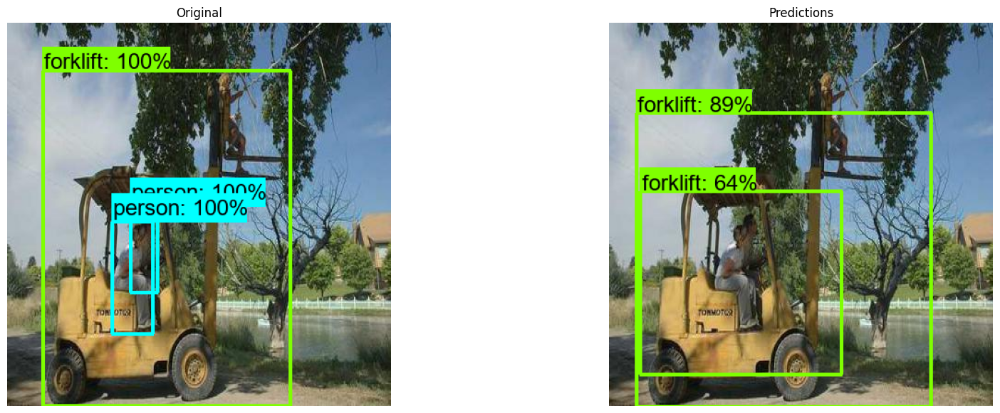

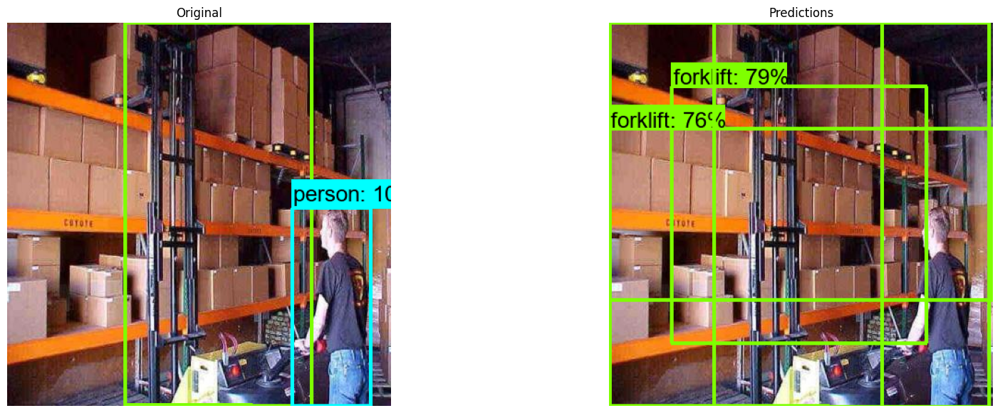

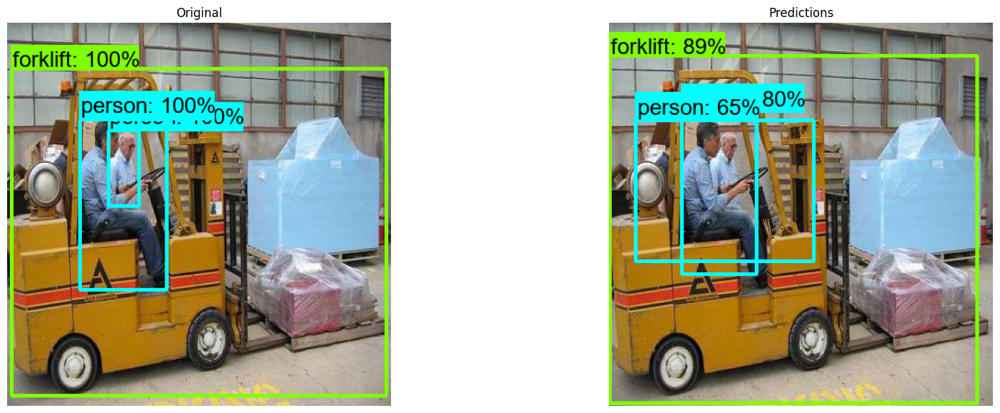

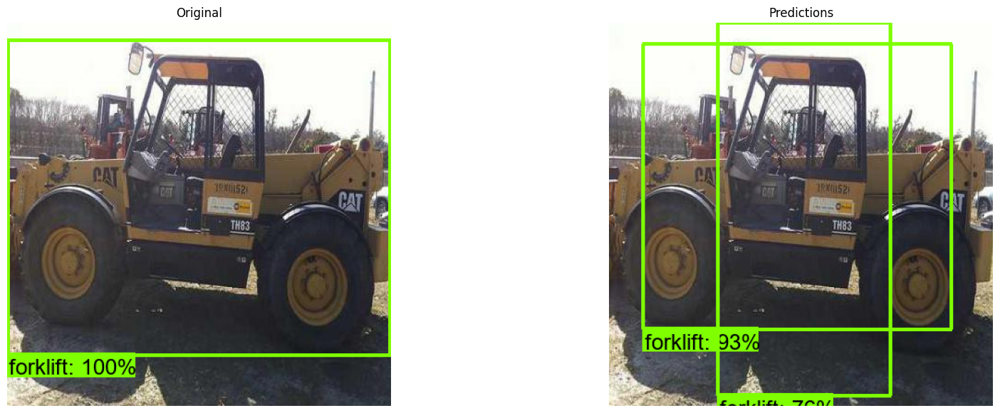

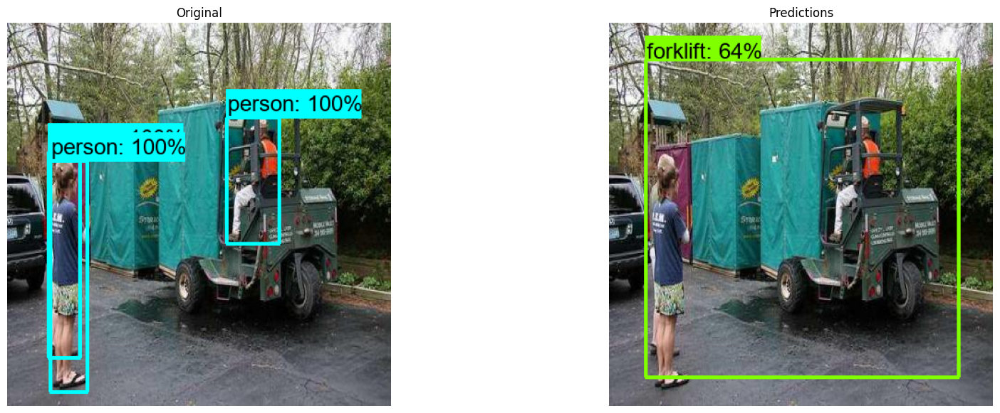

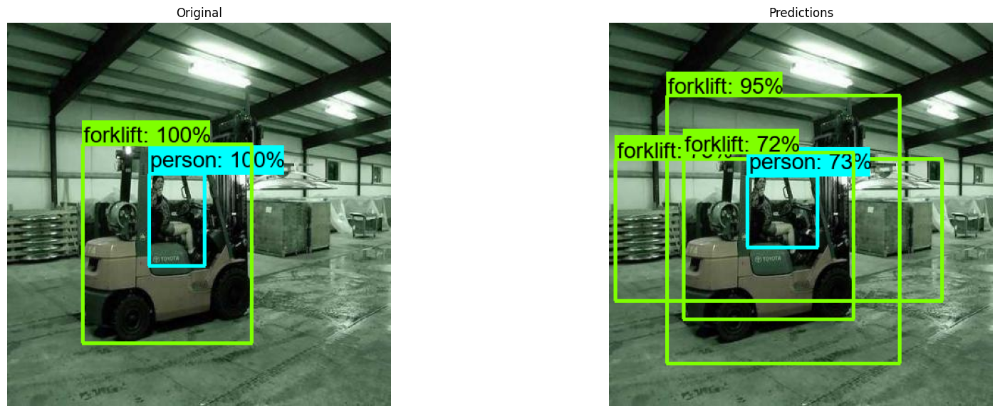

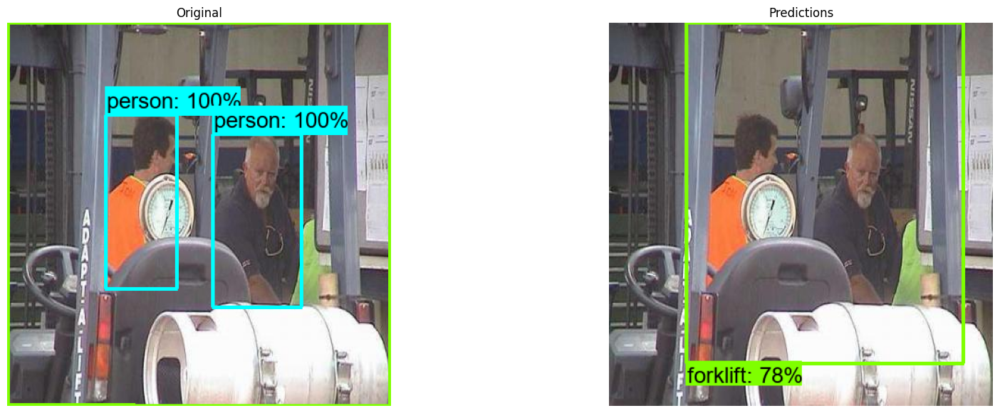

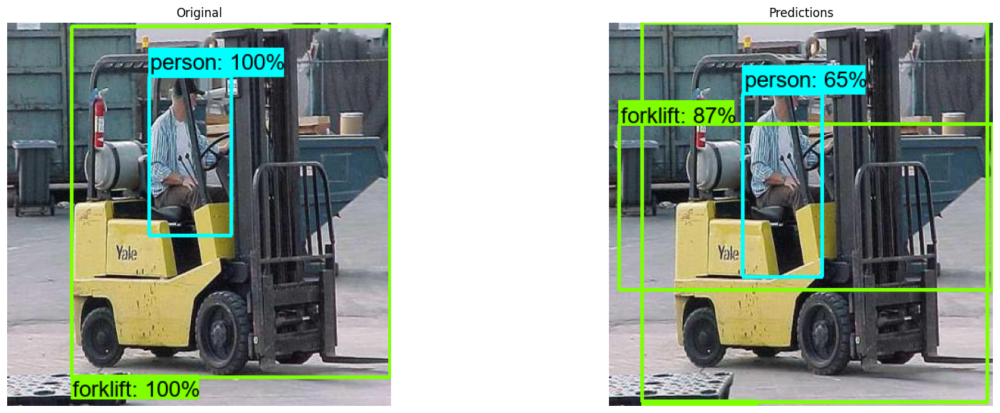

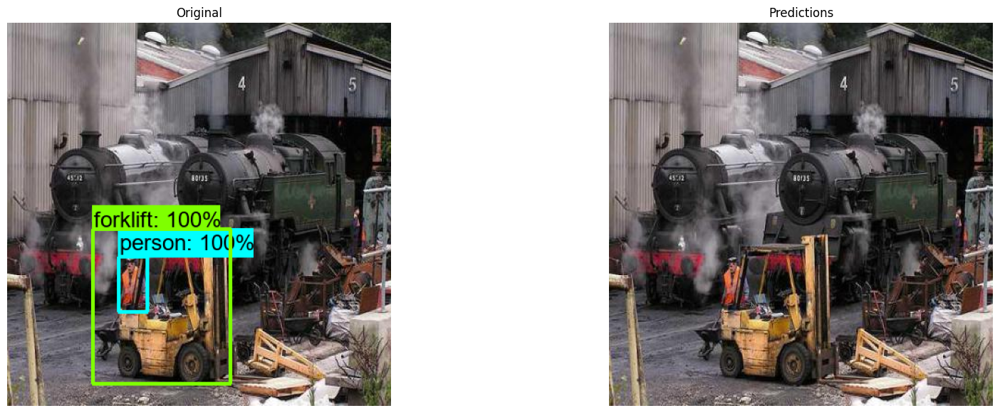

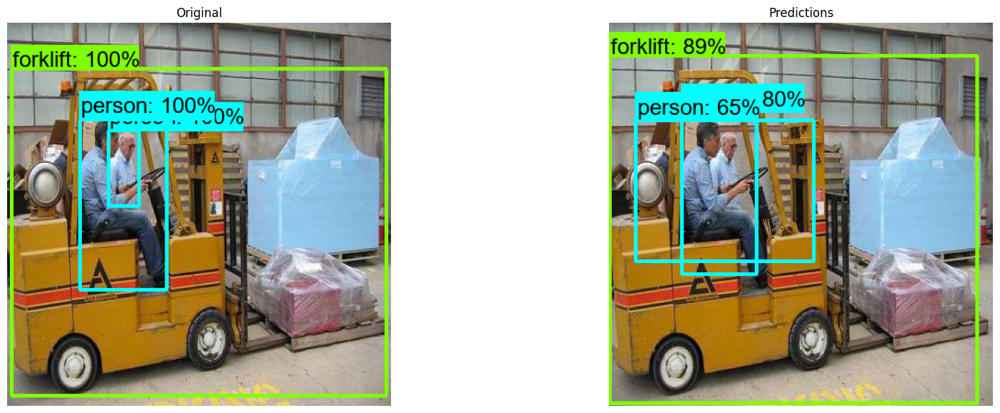

In [28]:
for i in range(10):
  idx = np.random.randint(len(test_df))

  #Path to the image
  image_path = test_df.filename[idx]
  #generate predictions for the image
  boxes, labels, scores = detect(f'{TEST_IMAGE_PATH}{image_path}', threshold=0.60)

  pred_image = draw_on_image(f'{TEST_IMAGE_PATH}{image_path}', boxes, scores, labels)

  real_image = load_image_from_data(test_df, index=idx, path=TEST_IMAGE_PATH)


  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1, figsize=(20,7))

  ax1.imshow(real_image)
  ax1.set_title("Original")
  ax1.axis("off")

  ax2.imshow(pred_image)
  ax2.set_title("Predictions")
  ax2.axis("off");

## Transfer Learning

pretrained = True  
Se utilizan los pesos preentrenados de ImageNet https://download.pytorch.org/models/resnet50-19c8e357.pth

In [33]:
NUM_TRAIN_EPOCHS = 500


from omegaconf import OmegaConf

#load in the hparams.ymal file using Omegaconf
hparams = OmegaConf.load("C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/pytorch_retinanet-master/hparams.yaml")

# ========================================================================= #
# MODIFICATION OF THE CONFIG FILE TO FIX PATHS AND DATSET-ARGUEMENTS :
# ========================================================================= #
hparams.dataset.kind        = "csv"
hparams.dataset.trn_paths   = TRAIN_CSV
hparams.dataset.valid_paths = VALID_CSV
hparams.dataset.test_paths  = TEST_CSV

hparams.dataloader.train_bs = 32
hparams.dataloader.valid_bs = 32
hparams.dataloader.test_bs  = 32

hparams.model.num_classes   = len(LABEL_MAP) - 1
hparams.model.backbone_kind = "resnet50"
hparams.model.min_size      = 416
hparams.model.max_size      = 416
hparams.model.pretrained    = True #loads in c-backbone weights
hparams.model.pretrained_file = "https://download.pytorch.org/models/resnet50-19c8e357.pth"

size = 416  # Reemplaza con el tamaño deseado

#transforms for the train_dataset
hparams.transforms  =  [
    {"class_name": "albumentations.HorizontalFlip", "params": {"p": 0.5} },
    {"class_name": "albumentations.Rotate", "params": {'limit':(-20, 20), "p": 0.5} },
    {"class_name": "albumentations.RandomResizedCrop", "params": {'height':size, 'width':size, 'scale':(0.8, 1.0), 'ratio':(0.9, 1.11), 'p':0.5 } },
    {"class_name": "albumentations.Blur", "params": {'blur_limit':(2, 3), 'p':0.3} },
    {"class_name": "albumentations.MedianBlur", "params": {'blur_limit':(3, 5) , 'p':0.2} },
    {"class_name": "albumentations.CLAHE", "params": {'clip_limit':(1, 4.0), 'tile_grid_size':(8, 8), 'p':0.3} },
    {"class_name": "albumentations.RandomBrightnessContrast", "params": {'brightness_limit':0.2, 'contrast_limit':0.2, 'p':0.5} },
    {"class_name": "albumentations.ColorJitter", "params": {'brightness':0.2, 'contrast':0.2, 'saturation':0.2, 'hue':0.09, 'p':0.4} }
]

hparams.optimizer = {
    "class_name": "torch.optim.Adam",
    "params"    : {"lr": 0.001, "weight_decay": 0.0005},
    }

hparams.loss = {
    "class_name": "torch.nn.SmoothL1Loss",
    "params": {"beta": 0.1}
}

#scheduler
hparams.scheduler = {
    "class_name" : "torch.optim.lr_scheduler.CosineAnnealingLR",
    "params"     : {"T_max": NUM_TRAIN_EPOCHS},
    "monitor"    : None,
    "interval"   : "epoch",
    "frequency"  : 1
    }

#training
hparams.training = {
    "metric" : "map_50"
    }

print(OmegaConf.to_yaml(hparams))

model:
  backbone_kind: resnet50
  num_classes: 2
  freeze_bn: true
  min_size: 416
  max_size: 416
  pretrained: true
  pretrained_file: https://download.pytorch.org/models/resnet50-19c8e357.pth
dataset:
  kind: csv
  root_dir: false
  trn_paths: C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/train/_annotations.csv
  valid_paths: C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/valid/_annotations.csv
  test_paths: C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/Forklift-2/test/_annotations.csv
dataloader:
  train_bs: 32
  valid_bs: 32
  test_bs: 32
  args:
    num_workers: 0
    pin_memory: true
transforms:
- class_name: albumentations.HorizontalFlip
  params:
    p: 0.5
- class_name: albumentations.Rotate
  params:
    limit:
    - -20
    - 20
    p: 0.5
- class_name: albumentations.RandomResizedCrop
  pa

In [34]:
import pytorch_lightning as pl
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import LearningRateMonitor, EarlyStopping

from model import RetinaNetModel

# seed so that results are reproducible
pl.seed_everything(123)

123

In [35]:
# ============================================================ #
# INSTANTIATE LIGHTNING-TRAINER with CALLBACKS :
# ============================================================ #
# NOTE:
# For a list of whole trainer specific arguments see :
# https://pytorch-lightning.readthedocs.io/en/latest/trainer.html

lr_logger  = LearningRateMonitor(logging_interval="step")

#instantiate LightningTrainer
trainer    = Trainer(precision=16, gpus=1, callbacks=[lr_logger], max_epochs=NUM_TRAIN_EPOCHS)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Using native 16bit precision.


In [36]:
# Instantiate lightning-module
litModel = RetinaNetModel(conf=hparams)

trainer.fit(litModel)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to C:\Users\alba_/.cache\torch\hub\checkpoints\resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:08<00:00, 12.5MB/s]
BACKBONE     : resnet50
INPUT_PARAMS : MAX_SIZE=416, MIN_SIZE=416
NUM_CLASSES  : 2

  | Name | Type      | Params
-----------------------------------
0 | net  | Retinanet | 36 M  


Epoch 499: 100%|██████████| 13/13 [00:06<00:00,  2.02it/s, loss=0.093, v_num=3, classification_loss=0.0342, regression_loss=0.0446, val_loss=0.806]


1

In [37]:
map = trainer.test(litModel)

creating index...
index created!
Testing: 100%|██████████| 2/2 [00:01<00:00,  1.42it/s]Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.08s).
Accumulating evaluation results...
DONE (t=0.03s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.173
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.493
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.040
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.129
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.245
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.309
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.175
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.285
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.299
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

**Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.299**

In [38]:
best_epoch = trainer.checkpoint_callback.best_model_path.split('=')[-1]
print(f"La mejor época fue la número {best_epoch}")


La mejor época fue la número 234.ckpt


In [42]:
import torch
PATH = f"C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/pytorch_retinanet-master/Resultados/trained_weights_withTF.pth"
torch.save(litModel.net.state_dict(), PATH)

In [46]:
import logging
logger = logging.getLogger("lightning")

import torch
from retinanet import Retinanet

PATH = f"C:/Users/alba_/Documents/Especializacion/4to_Bimestre/Vision_por_Computadora_2/vision_computadora_II/pytorch_retinanet-master/Resultados/trained_weights_withTF.pth"

#load saved model state dict
state_dict = torch.load(PATH)
#model arguments same as the arguments used to train the model
model_args = hparams.model
#load pytorch model without the lightning-module
#using args and state dict
MODEL      = Retinanet(**model_args, logger=logger)
MODEL.load_state_dict(state_dict)
MODEL.eval()
MODEL.to("cuda:0");

BACKBONE     : resnet50
INPUT_PARAMS : MAX_SIZE=416, MIN_SIZE=416
NUM_CLASSES  : 2


## Inference

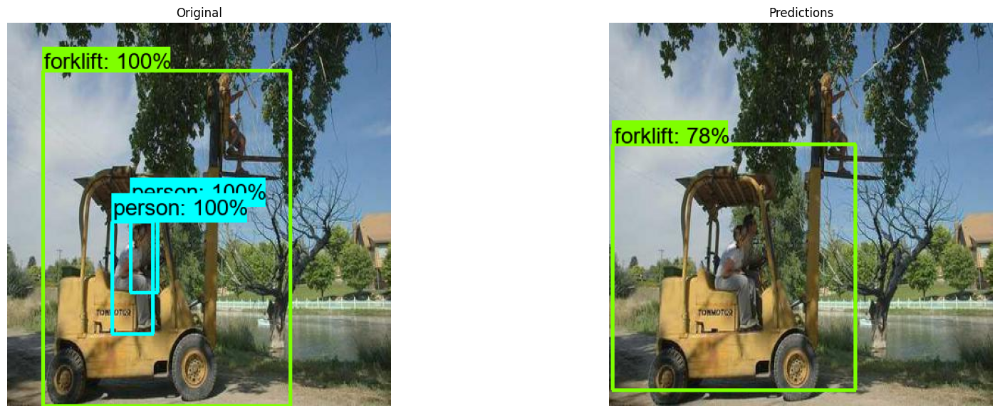

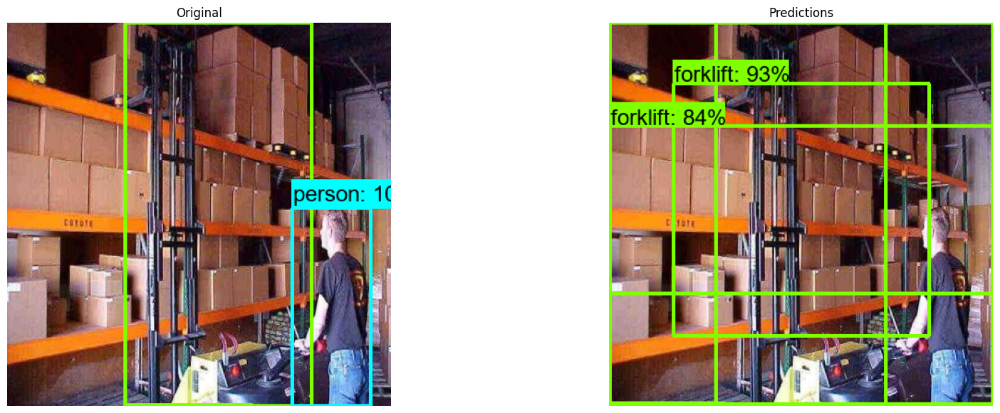

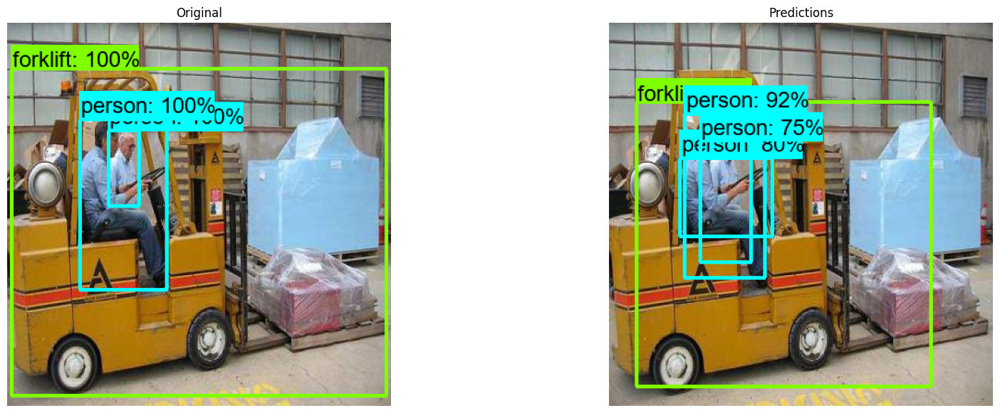

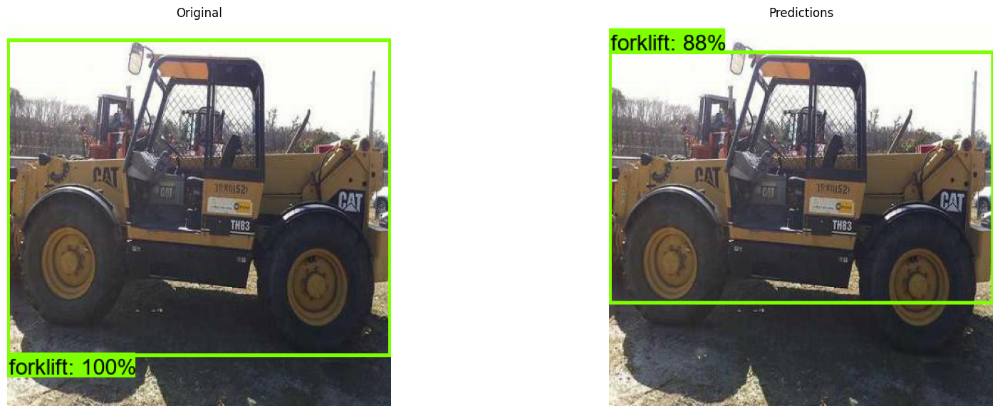

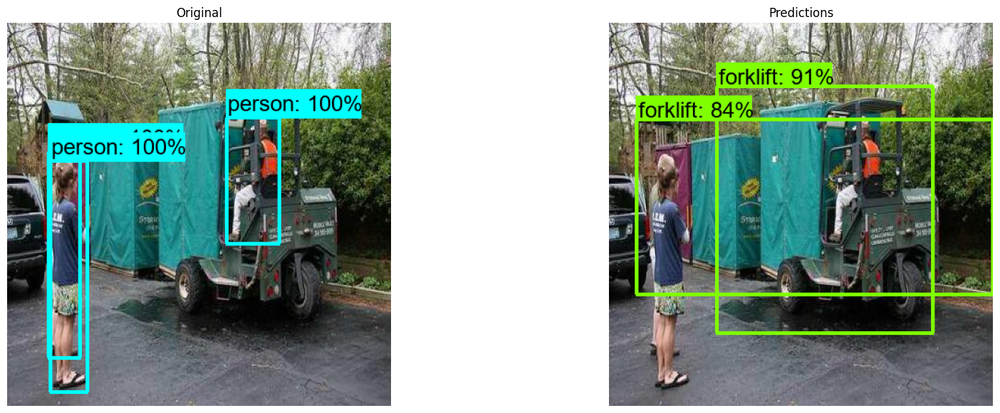

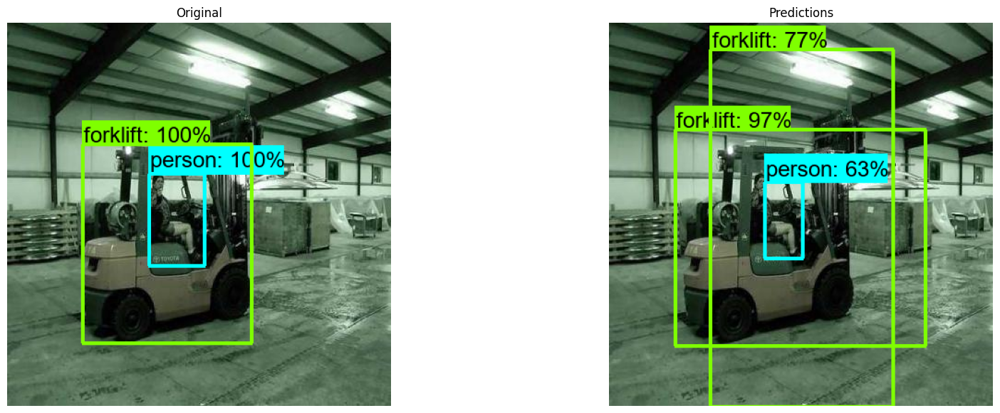

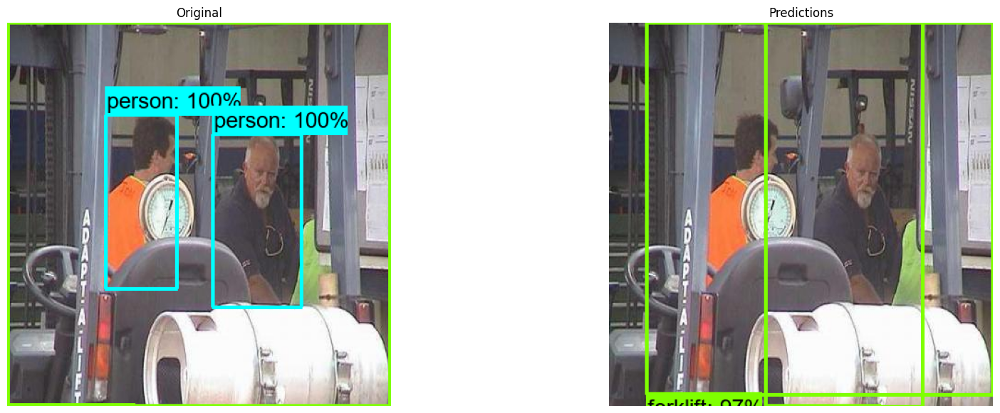

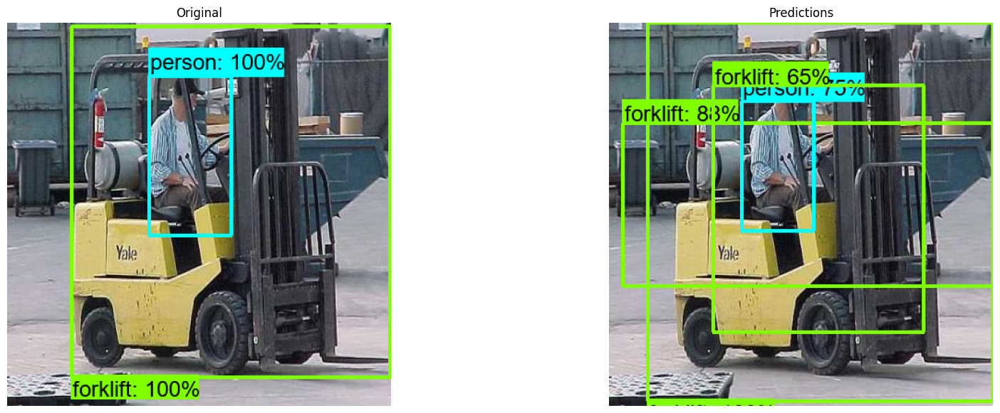

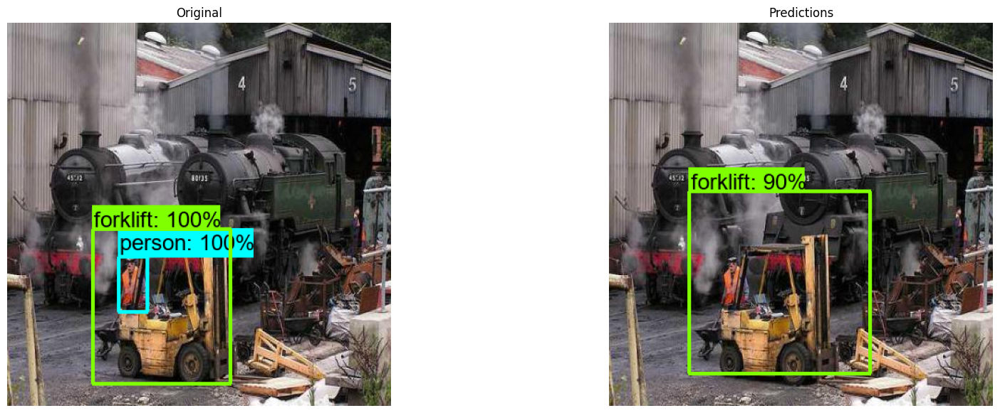

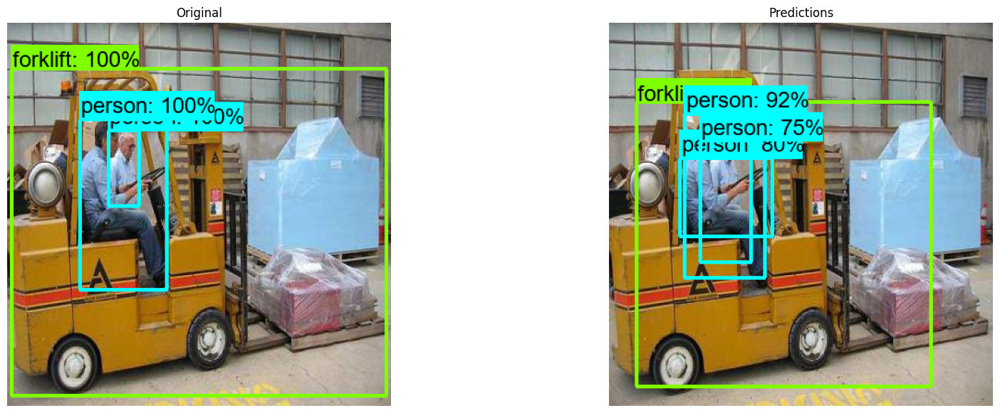

In [44]:
for i in range(10):
  idx = np.random.randint(len(test_df))

  #Path to the image
  image_path = test_df.filename[idx]
  #generate predictions for the image
  boxes, labels, scores = detect(f'{TEST_IMAGE_PATH}{image_path}', threshold=0.60)

  pred_image = draw_on_image(f'{TEST_IMAGE_PATH}{image_path}', boxes, scores, labels)

  real_image = load_image_from_data(test_df, index=idx, path=TEST_IMAGE_PATH)


  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1, figsize=(20,7))

  ax1.imshow(real_image)
  ax1.set_title("Original")
  ax1.axis("off")

  ax2.imshow(pred_image)
  ax2.set_title("Predictions")
  ax2.axis("off");